In [1]:
import gc
import os
import cv2
import sys
import json
import tqdm
import time
import timm
import torch
import random
import sklearn.metrics

from PIL import Image
from pathlib import Path
from functools import partial
from contextlib import contextmanager

import numpy as np
import scipy as sp
import pandas as pd
import torch.nn as nn

from torch.optim import Adam, SGD
from scipy.special import softmax
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader, Dataset
from albumentations import Compose, Normalize, Resize
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, accuracy_score, top_k_accuracy_score

os.environ["CUDA_VISIBLE_DEVICES"]="2"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## Loading and Parsing Metadata

### Loading metadata files

In [3]:
train_metadata = pd.read_csv("/Datasets/SvampeAtlas-14.12.2020/metadata/DanishFungi2020_train_metadata_DEV.csv")
test_metadata = pd.read_csv("/Datasets/SvampeAtlas-14.12.2020/metadata/DanishFungi2020_test_metadata_DEV.csv")
test_metadata_genera = pd.read_csv("/Datasets/SvampeAtlas-14.12.2020/metadata/DanishFungi2020-Mini_test_metadata_DEV.csv")

In [4]:
print(len(train_metadata), len(test_metadata), len(test_metadata_genera))

266344 29594 3640


In [5]:
metadata = pd.concat([train_metadata, test_metadata])
len(metadata)

295938

In [6]:
test_metadata.Habitat = test_metadata.Habitat.replace(np.nan, 'unknown', regex=True)
test_metadata.Substrate = test_metadata.Substrate.replace(np.nan, 'unknown', regex=True)
# test_metadata.month = test_metadata.month.replace(np.nan, 'unknown', regex=True)

In [7]:
metadata.Habitat = metadata.Habitat.replace(np.nan, 'unknown', regex=True)
metadata.Substrate = metadata.Substrate.replace(np.nan, 'unknown', regex=True)
# metadata.month = metadata.month.replace(np.nan, 0, regex=True)

In [8]:
metadata.Substrate.unique()

array(['bark of living trees', 'dead wood (including bark)', 'soil',
       'stone', 'leaf or needle litter', 'wood', 'living leaves', 'bark',
       'siliceous stone', 'cones', 'peat mosses',
       'stems of herbs, grass etc', 'building stone (e.g. bricks)',
       'dead stems of herbs, grass etc', 'wood chips or mulch', 'unknown',
       'wood and roots of living trees',
       'living stems of herbs, grass etc', 'faeces', 'mosses', 'fungi',
       'insects', 'fruits', 'fire spot', 'catkins', 'lichens',
       'other substrate', 'calcareous stone', 'living flowers',
       'remains of vertebrates (e.g. feathers and fur)', 'liverworts',
       'mycetozoans'], dtype=object)

In [9]:
class_to_genus = np.zeros(len(metadata['class_id'].unique()))
for species in metadata['class_id'].unique():
    class_to_genus[species] = metadata[metadata['class_id'] == species]['genus_id'].unique()[0]

### Extracting Species distribution

In [10]:
class_priors = np.zeros(len(metadata['class_id'].unique()))
for species in metadata['class_id'].unique():
    class_priors[species] = len(metadata[metadata['class_id'] == species])

class_priors = class_priors/sum(class_priors)

### Extracting species-month distribution

In [11]:
month_distributions = {}

for _, observation in tqdm.tqdm(metadata.iterrows(), total=len(metadata)):
    month = str(observation.month)
    class_id = observation.class_id
    if month not in month_distributions:        
        month_distributions[month] = np.zeros(len(metadata['class_id'].unique()))
    else:
        month_distributions[month][class_id] += 1

for key, value in month_distributions.items():
    month_distributions[key] = value / sum(value)

100%|██████████| 295938/295938 [00:21<00:00, 13969.58it/s]


### Extracting species-habitat distribution

In [12]:
habitat_distributions = {}

for _, observation in tqdm.tqdm(metadata.iterrows(), total=len(metadata)):
    habitat = observation.Habitat
    class_id = observation.class_id
    if habitat not in habitat_distributions:        
        habitat_distributions[habitat] = np.zeros(len(metadata['class_id'].unique()))
    else:
        habitat_distributions[habitat][class_id] += 1

for key, value in habitat_distributions.items():
    habitat_distributions[key] = value / sum(value)

100%|██████████| 295938/295938 [00:20<00:00, 14326.30it/s]


### Extracting species-substrate distribution

In [13]:
substrate_distributions = {}

for _, observation in tqdm.tqdm(metadata.iterrows(), total=len(metadata)):
    substrate = observation.Substrate
    class_id = observation.class_id
    if substrate not in substrate_distributions:        
        substrate_distributions[substrate] = np.zeros(len(metadata['class_id'].unique()))
    else:
        substrate_distributions[substrate][class_id] += 1

for key, value in substrate_distributions.items():
    substrate_distributions[key] = value / sum(value)

100%|██████████| 295938/295938 [00:20<00:00, 14323.94it/s]


## Predicting with trained network

In [14]:
def seed_torch(seed=777):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

SEED = 777
seed_torch(SEED)

In [15]:
class TestDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):

        file_path = self.df['image_path'].values[idx]
        label = self.df['class_id'].values[idx]
        month = self.df['month'].values[idx]
        sub = self.df['Substrate'].values[idx]
        hab = self.df['Habitat'].values[idx]
        
        image = cv2.imread(file_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']
        return image, label, file_path, month, hab, sub


In [16]:
WIDTH, HEIGHT = 224, 224

def get_transforms():

    return Compose([Resize(WIDTH, HEIGHT),
                    Normalize(mean = model_mean, std = model_std),
                    ToTensorV2()])

In [17]:
def getModel(architecture_name, target_size, pretrained = False):
    net = timm.create_model(architecture_name, pretrained=pretrained)
    net_cfg = net.default_cfg
    last_layer = net_cfg['classifier']
    num_ftrs = getattr(net, last_layer).in_features
    setattr(net, last_layer, nn.Linear(num_ftrs, target_size))
    return net

In [ ]:
NUM_CLASSES = 1604


MODEL_NAME = 'vit_base_patch16_224'
#MODEL_NAME = 'vit_large_patch16_384'
model = getModel(MODEL_NAME, NUM_CLASSES, pretrained=True)
model_mean = list(model.default_cfg['mean'])
model_std = list(model.default_cfg['std'])
#model = nn.DataParallel(model)

#READ STATE DICT!!!
model.load_state_dict(torch.load('../../checkpoints/DF20-ViT_base_patch16_224_best_accuracy.pth'))
#model.load_state_dict(torch.load('../../checkpoints/SvampeAtlas-ViT_large_patch16_384_best_loss.pth'))

model.to(device)
model.eval()

In [19]:
#test_dataset_genera = TestDataset(test_metadata_genera, test_metadata_genera['class_id'], transform=get_transforms())
test_dataset = TestDataset(test_metadata, transform=get_transforms())

In [20]:
batch_size = 64

#test_loader_genera = DataLoader(test_dataset_genera, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

In [21]:
avg_val_loss = 0.
preds = np.zeros((len(test_metadata)))
GT_lbls = []
image_paths = []
preds_raw = []
criterion = nn.CrossEntropyLoss()
months = []
subs = []
habitats = []

for i, (images, labels, paths, M, H, S) in enumerate(tqdm.tqdm(test_loader, total=len(test_loader))):

    images = images.to(device)
    labels = labels.to(device)
    
    with torch.no_grad():
        y_preds = model(images)
    preds[i * batch_size: (i+1) * batch_size] = y_preds.argmax(1).to('cpu').numpy()
    GT_lbls.extend(labels.to('cpu').numpy())
    preds_raw.extend(y_preds.to('cpu').numpy())
    image_paths.extend(paths)
    months.extend(M)
    subs.extend(S)
    habitats.extend(H)

vanilla_f1 = f1_score(test_metadata['class_id'], preds, average='macro')
vanilla_accuracy = accuracy_score(test_metadata['class_id'], preds)
vanilla_recall_3 = top_k_accuracy_score(test_metadata['class_id'], preds_raw, k=3)

print('Vanilla:', vanilla_f1, vanilla_accuracy, vanilla_recall_3)

100%|██████████| 463/463 [05:19<00:00,  1.45it/s]


Vanilla: 0.6580590292932047 0.7353517604919916 0.8721024531999729


### Weighting by Habitat

In [22]:
wrong_predictions_H = []
weighted_predictions_H = []
weighted_predictions_raw_H = []
prior_ratio_H = []

for lbl, preds, hab in tqdm.tqdm(zip(GT_lbls, preds_raw, habitats), total=len(GT_lbls)):
    
    habitat_dist = habitat_distributions[hab]
    preds = softmax(preds)
    
    p_habitat = (preds * habitat_dist) / sum(preds * habitat_dist)
    prior_ratio = p_habitat / class_priors
    max_index = np.argmax(prior_ratio * preds)        
    
    prior_ratio_H.append(prior_ratio)
    weighted_predictions_raw_H.append(prior_ratio * preds)
    weighted_predictions_H.append(max_index)
    
    if lbl != max_index:
        wrong_predictions_H.append([lbl, hab])

f1 = f1_score(test_metadata['class_id'], weighted_predictions_H, average='macro')
accuracy = accuracy_score(test_metadata['class_id'], weighted_predictions_H)
recall_3 = top_k_accuracy_score(test_metadata['class_id'], weighted_predictions_raw_H, k=3)
print('Habitat:', f1, accuracy, recall_3)
print('Habitat dif:', f1-vanilla_f1, accuracy-vanilla_accuracy, recall_3-vanilla_recall_3)

100%|██████████| 29594/29594 [00:09<00:00, 2987.17it/s]


Habitat: 0.6940788360694818 0.7553220247347435 0.8861255659931067
Habitat dif: 0.03601980677627714 0.019970264242751945 0.01402311279313373


### Weighting by Substrate

In [23]:
wrong_predictions_S = []
weighted_predictions_S = []
weighted_predictions_raw_S = []
prior_ratio_S = []

for lbl, preds, sub in tqdm.tqdm(zip(GT_lbls, preds_raw, subs), total=len(GT_lbls)):

    substrate_dist = substrate_distributions[sub]
    preds = softmax(preds)
    
    p_substrate = (preds * substrate_dist) / sum(preds * substrate_dist)
    prior_ratio = p_substrate / class_priors
    max_index = np.argmax(prior_ratio * preds)     
    
    prior_ratio_S.append(prior_ratio)
    weighted_predictions_raw_S.append(prior_ratio * preds)
    weighted_predictions_S.append(max_index)
    
    if lbl != max_index:
        wrong_predictions_S.append([lbl, sub])
        
f1 = f1_score(test_metadata['class_id'], weighted_predictions_S, average='macro')
accuracy = accuracy_score(test_metadata['class_id'], weighted_predictions_S)
recall_3 = top_k_accuracy_score(test_metadata['class_id'], weighted_predictions_raw_S, k=3)
print('Substrate:', f1, accuracy, recall_3)
print('Substrate dif:', f1-vanilla_f1, accuracy-vanilla_accuracy, recall_3-vanilla_recall_3)

100%|██████████| 29594/29594 [00:09<00:00, 2976.99it/s]


Substrate: 0.6818802103115132 0.7490369669527607 0.884267081165101
Substrate dif: 0.023821181018308546 0.013685206460769095 0.012164627965128072


### Weighting by Month

In [24]:
wrong_predictions_M = []
weighted_predictions_M = []
weighted_predictions_raw_M = []
prior_ratio_M = []

for lbl, preds, month in tqdm.tqdm(zip(GT_lbls, preds_raw, months), total=len(GT_lbls)):
    
    month_dist = month_distributions[str(float(month))]
    preds = softmax(preds)
    
    p_month = (preds * month_dist) / sum(preds * month_dist)
    prior_ratio = p_month / class_priors        
    max_index = np.argmax(prior_ratio * preds)     
    
    prior_ratio_M.append(prior_ratio)
    weighted_predictions_raw_M.append(prior_ratio * preds)
    weighted_predictions_M.append(max_index)
    
    if lbl != max_index:
        wrong_predictions_M.append([lbl, month])

f1 = f1_score(test_metadata['class_id'], weighted_predictions_M, average='macro')
accuracy = accuracy_score(test_metadata['class_id'], weighted_predictions_M)
recall_3 = top_k_accuracy_score(test_metadata['class_id'], weighted_predictions_raw_M, k=3)
print('Month:', f1, accuracy, recall_3)
print('Month dif:', f1-vanilla_f1, accuracy-vanilla_accuracy, recall_3-vanilla_recall_3)

100%|██████████| 29594/29594 [00:09<00:00, 2967.54it/s]


Month: 0.6742992574057156 0.7450834628640941 0.8814962492397107
Month dif: 0.016240228112510913 0.009731702372102524 0.009393796039737778


### Weighting by Month and Substrate

In [25]:
from scipy.special import softmax

merged_predictions = []
merged_predictions_raw = []

for o, m, s, h in tqdm.tqdm(zip(preds_raw, prior_ratio_M, prior_ratio_S, prior_ratio_H), total=len(prior_ratio_M)):
    
    preds = softmax(preds)
        
    m_pred = (preds * m * s) / sum(preds * m * s)
    max_index = np.argmax(m_pred)
    
    merged_predictions_raw.append(m_pred)
    merged_predictions.append(max_index)
    
f1 = f1_score(test_metadata['class_id'], merged_predictions, average='macro')
accuracy = accuracy_score(test_metadata['class_id'], merged_predictions)
recall_3 = top_k_accuracy_score(test_metadata['class_id'], merged_predictions_raw, k=3)
print('M+S:' , f1, accuracy, recall_3)
print('M+S dif:', f1-vanilla_f1, accuracy-vanilla_accuracy, recall_3-vanilla_recall_3)

100%|██████████| 29594/29594 [00:09<00:00, 3043.39it/s]


M+S: 0.6973860229806211 0.7582956004595526 0.8929850645401095
M+S dif: 0.039326993687416434 0.022943839967560997 0.02088261134013658


### Weighting by Month and Habitat

In [26]:
merged_predictions = []
merged_predictions_raw = []

for o, m, s, h in tqdm.tqdm(zip(preds_raw, prior_ratio_M, prior_ratio_S, prior_ratio_H), total=len(prior_ratio_M)):
    
    preds = softmax(preds)
    
    m_pred = (preds * m * h) / sum((preds * m * h))
    max_index = np.argmax(m_pred)
    
    merged_predictions_raw.append(m_pred)    
    merged_predictions.append(max_index)

f1 = f1_score(test_metadata['class_id'], merged_predictions, average='macro')
accuracy = accuracy_score(test_metadata['class_id'], merged_predictions)
recall_3 = top_k_accuracy_score(test_metadata['class_id'], merged_predictions_raw, k=3)
print('M+H:', f1, accuracy, recall_3)    
print('M+H dif:', f1-vanilla_f1, accuracy-vanilla_accuracy, recall_3-vanilla_recall_3)

100%|██████████| 29594/29594 [00:09<00:00, 3121.90it/s]


M+H: 0.7093092809612803 0.764479286341826 0.8959248496316821
M+H dif: 0.05125025166807562 0.029127525849834468 0.023822396431709136


### Weighting by Substrate and Habitat

In [27]:
merged_predictions = []
merged_predictions_raw = []

for o, m, s, h in tqdm.tqdm(zip(preds_raw, prior_ratio_M, prior_ratio_S, prior_ratio_H), total=len(prior_ratio_M)):
    
    preds = softmax(preds)
    
    m_pred = (preds * s * h) / sum((preds * s * h))
    max_index = np.argmax(m_pred)
    
    merged_predictions_raw.append(m_pred)    
    merged_predictions.append(max_index)

f1 = f1_score(test_metadata['class_id'], merged_predictions, average='macro')
accuracy = accuracy_score(test_metadata['class_id'], merged_predictions)
recall_3 = top_k_accuracy_score(test_metadata['class_id'], merged_predictions_raw, k=3)
print('S+H:' , f1, accuracy, recall_3)
print('S+H dif:', f1-vanilla_f1, accuracy-vanilla_accuracy, recall_3-vanilla_recall_3)

100%|██████████| 29594/29594 [00:09<00:00, 3128.07it/s]


S+H: 0.7142466736898264 0.7668784213016152 0.8969723592620126
S+H dif: 0.056187644396621717 0.03152666080962363 0.02486990606203965


### Weighting by Month, Substrate and Habitat

In [28]:
from scipy.special import softmax

wrong_predictions_all = []
merged_predictions = []
merged_predictions_raw = []

wrong_predictions_all_genus = []
merged_predictions_genus = []

for lbl, img_path, o, m, s, h in tqdm.tqdm(zip(GT_lbls, image_paths, preds_raw, prior_ratio_M, prior_ratio_S, prior_ratio_H), total=len(prior_ratio_M)):
    
    preds = softmax(preds)
 
    m_pred = (preds * m * s * h) / sum((preds * m * s * h))
    max_index = np.argmax(m_pred)
    
    merged_predictions_raw.append(m_pred)    
    merged_predictions.append(max_index)
    
    merged_predictions_genus.append(class_to_genus[max_index])
    
    if lbl != max_index:
        wrong_predictions_all.append([lbl, max_index, img_path])
    
        if class_to_genus[lbl] != class_to_genus[max_index]:
            wrong_predictions_all_genus.append([lbl, max_index, img_path])
            
f1 = f1_score(test_metadata['class_id'], merged_predictions, average='macro')
accuracy = accuracy_score(test_metadata['class_id'], merged_predictions)
recall_3 = top_k_accuracy_score(test_metadata['class_id'], merged_predictions_raw, k=3)
recall_5 = top_k_accuracy_score(test_metadata['class_id'], merged_predictions_raw, k=5)
recall_10 = top_k_accuracy_score(test_metadata['class_id'], merged_predictions_raw, k=10)

print('All:', f1, accuracy, recall_3, recall_5, recall_10)
print('All dif:', f1-vanilla_f1, accuracy-vanilla_accuracy, recall_3-vanilla_recall_3)

100%|██████████| 29594/29594 [00:09<00:00, 3050.45it/s]


All: 0.7205578743558285 0.77113604108941 0.9024464418463202 0.932689058592958 0.9590795431506386
All dif: 0.06249884506262382 0.03578428059741845 0.030343988646347242


In [29]:
f1 = f1_score(test_metadata['genus_id'], merged_predictions_genus, average='macro')
accuracy = accuracy_score(test_metadata['genus_id'], merged_predictions_genus)
print('All:', f1, accuracy)

All: 0.7977034570145061 0.8504764479286342


In [30]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print('Confusion Matrix')
print(confusion_matrix(GT_lbls, merged_predictions))

Confusion Matrix
[[27  0  0 ...  0  0  0]
 [ 0 18  0 ...  0  0  0]
 [ 0  0  5 ...  0  0  0]
 ...
 [ 0  0  0 ...  5  0  0]
 [ 0  0  0 ...  0 37  6]
 [ 0  0  0 ...  0  7 28]]


In [31]:
labels = test_metadata['class_id'].unique()
cm = confusion_matrix(GT_lbls, merged_predictions)

round(pd.Series(cm.diagonal() / cm.sum(axis=0) * 100), 2)\
    .rename({i: name for i, name in enumerate(labels)})

<ipython-input-31-0bcfc30809c6>:4: RuntimeWarning: invalid value encountered in true_divide
  round(pd.Series(cm.diagonal() / cm.sum(axis=0) * 100), 2)\


779      77.14
967      90.00
170      83.33
1214    100.00
1141     61.40
         ...  
303      33.33
609      33.33
1286     62.50
1423     56.92
431      50.91
Length: 1604, dtype: float64

In [32]:
report = classification_report(GT_lbls, merged_predictions, output_dict=True)

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [38]:
p = []
r = []
for c, values in report.items():
    p.append(values['precision'])
    r.append(values['recall'])

TypeError: 'float' object is not subscriptable

In [39]:
sns.relplot(x=p, y=r, color="purple")
sns.rugplot(x=p, y=r, color="purple")
# sns.kdeplot(x=p, y=r, color="purple", fill=True)

NameError: name 'sns' is not defined

In [40]:
import seaborn as sns

<AxesSubplot:>

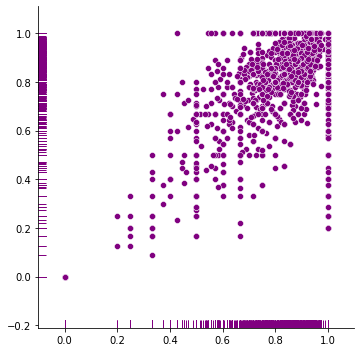

In [41]:
sns.relplot(x=p, y=r, color="purple")
sns.rugplot(x=p, y=r, color="purple")
# sns.kdeplot(x=p, y=r, color="purple", fill=True)

In [43]:
from matplotlib import pyplot as plt

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize = (100, 100))

sns.heatmap(
    np.round(cm / cm.sum(axis=0), 3), 
    cmap='YlGnBu', 
    annot=True,
    annot_kws={'fontsize': 8},
    fmt='g',
    #xticklabels=labels, 
    #yticklabels=labels,
)

plt.subplots_adjust(left=.25)
plt.subplots_adjust(bottom=.3)

plt.xlabel('Original label')
plt.ylabel('Predicted label')

In [58]:
len(wrong_predictions_all)

4915

In [59]:
wrong_predictions_all[0]

[170, 1117, '/Datasets/SvampeAtlas-14.12.2020/2238578371-259639.jpg']

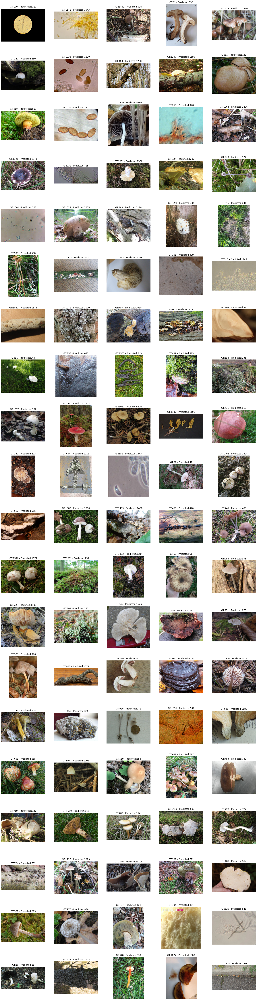

In [63]:
plt.figure(figsize=(25, 100))
for i in range(100):
    ax = plt.subplot(20, 5, i + 1)
    plt.imshow(Image.open(wrong_predictions_all[i][2]))
    plt.title("GT:" + str(wrong_predictions_all[i][0]) + ' - Predicted:' + str(int(wrong_predictions_all[i][1])))
    plt.axis('off')

# OLD STUFF

In [60]:
# from scipy.special import softmax

# wrong_predictions_M = []
# weighted_predictions_M = []
# weighted_predictions_raw_M = []

# for a, b, c in tqdm.tqdm(zip(GT_lbls, preds_raw, months), total=len(GT_lbls)):
#     max_index = np.argmax(softmax(b)) 
#     try:
#         month = int(c.numpy())-1
#         species_months = np.array(np.array(species_distributions_list)[:, month])
#         max_index = np.argmax(softmax(b) * species_months)
#         weighted_predictions_raw_M.append((softmax(b) * species_months) / sum(softmax(b) * species_months))    

#     except:
#         max_index = np.argmax(softmax(b))
#         weighted_predictions_raw_M.append(softmax(b))
        
#     weighted_predictions_M.append(max_index)
    
#     if a != max_index:
#         wrong_predictions_M.append([a, c])

100%|██████████| 29594/29594 [00:24<00:00, 1204.19it/s]
